## SMT Mini EDA (OHBM)

### Imports

In [19]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [20]:
from env.imports import *

In [21]:
import importlib
import data

import models
import sim.sim
import sim.sim_utils
from sim.sim_utils import bytes2human, print_system_usage
from sim.sim import Simulation
from sim.sim_run import single_sim_run
from sim.wandb_scrape import *
from collections import defaultdict

#### Check job specs

In [22]:
print_system_usage()

total = psutil.disk_usage('/').total
print(bytes2human(total))

CPU Usage: 12.9%
RAM Usage: 3.9%
Available RAM: 1.4T
Total RAM: 1.5T
52.4G


## Data load

In [23]:
from data.data_load import load_transcriptome, load_connectome, load_coords, load_network_labels

from models.bilinear import BilinearCM, BilinearLowRank
from models.dynamic_mlp import DynamicMLP
from models.smt import SharedSelfAttentionModel, SharedSelfAttentionCLSModel
from models.smt_cross import CrossAttentionGeneVecModel, MixedAttentionGeneVecModel, SelfAttentionGeneVecModel

# Load data
print("Loading data...")

full_gene_list='0.2'
hvg_gene_list='100_var'

# Load two versions of gene expression data based on gene lists
X_full, valid_genes_full = load_transcriptome(parcellation='S456', gene_list=full_gene_list, hemisphere='both', omit_subcortical=False, sort_genes='refgenome', impute_strategy='mirror_interpolate', return_valid_genes=True)
X_hvg, valid_genes_hvg = load_transcriptome(parcellation='S456', gene_list=hvg_gene_list, hemisphere='both', omit_subcortical=False, sort_genes='refgenome', impute_strategy='mirror_interpolate', return_valid_genes=True)

Y = load_connectome(dataset='HCP', parcellation='S456', hemisphere='both', omit_subcortical=False)
coords = load_coords(parcellation='S456', hemisphere='both', omit_subcortical=False)
labels, network_labels = load_network_labels(parcellation='S456', hemisphere='both', omit_subcortical=False)

# Find rows that are not all NaN - necessary for gene expression data with unsampled regions
valid_indices = ~np.isnan(X_full).all(axis=1)

# Subset all data using valid indices
X_full_valid = X_full[valid_indices]
X_hvg_valid = X_hvg[valid_indices]
Y_valid = Y[valid_indices][:, valid_indices]
coords_valid = coords[valid_indices]
labels = [labels[i] for i in range(len(labels)) if valid_indices[i]]
network_labels = network_labels[valid_indices]

# prepare data loaders for each type
X_full = torch.tensor(X_full_valid, dtype=torch.float32).to("cuda")
X_hvg = torch.tensor(X_hvg_valid, dtype=torch.float32).to("cuda")
coords = torch.tensor(coords_valid, dtype=torch.float32).to("cuda")

# Create datasets
dataset_full = TensorDataset(X_full, coords)
dataset_hvg = TensorDataset(X_hvg, coords)

# Create dataloaders
dataloader_full = DataLoader(dataset_full, batch_size=X_full_valid.shape[0], shuffle=False)
dataloader_hvg = DataLoader(dataset_hvg, batch_size=X_hvg_valid.shape[0], shuffle=False)

from data.data_utils import RegionPairDataset

# Create index map so we know true indices of valid data
valid_indices_values = np.where(valid_indices)[0]
valid2true_mapping = dict(enumerate(valid_indices_values))

# Create full pairwise dataset
print("Creating full and HVG pairwise datasets...")

# Create full pairwise dataset
full_dataset = RegionPairDataset(
    X=X_full_valid,
    Y=Y_valid, 
    coords=coords_valid,
    dataset='HCP',
    parcellation='S456',
    valid2true_mapping=valid2true_mapping,
    valid_genes=valid_genes_full
)

# Create HVG pairwise dataset
hvg_dataset = RegionPairDataset(
    X=X_hvg_valid,
    Y=Y_valid,
    coords=coords_valid, 
    dataset='HCP',
    parcellation='S456',
    valid2true_mapping=valid2true_mapping,
    valid_genes=valid_genes_hvg
)

print(f"Full dataset: {len(full_dataset)} region pairs")
print(f"HVG dataset: {len(hvg_dataset)} region pairs")

# Create dataloaders
full_dataloader = DataLoader(
    full_dataset,
    batch_size=512,
    shuffle=False,
    num_workers=4,
    pin_memory=True
)

hvg_dataloader = DataLoader(
    hvg_dataset,
    batch_size=512, 
    shuffle=False,
    num_workers=4,
    pin_memory=True
)


Loading data...
Resorting genes by reference genome order
Resorting genes by reference genome order
Creating full and HVG pairwise datasets...
Full dataset: 206570 region pairs
HVG dataset: 206570 region pairs


### SMT mini self attention analysis

In [29]:
# Null/spin version for HVG
X_hvg_spin = load_transcriptome(
    null_model='spin',
    random_seed=500,
    parcellation='S456',
    gene_list=hvg_gene_list,
    hemisphere='both',
    omit_subcortical=False,
    sort_genes='refgenome',
    impute_strategy='mirror_interpolate',
    return_valid_genes=False
)

valid_indices = ~np.isnan(X_hvg_spin).all(axis=1)
X_hvg_spin_valid = X_hvg_spin[valid_indices]
X_hvg_spin = torch.tensor(X_hvg_spin_valid, dtype=torch.float32).to("cuda")

dataset_hvg_spin = TensorDataset(X_hvg_spin, coords)
spin_dataloader_hvg = DataLoader(dataset_hvg_spin, batch_size=X_hvg_spin_valid.shape[0], shuffle=False)

Resorting genes by reference genome order
Spinning gene expression
Spin index for seed 500: 499
Mean error rank for spin index 499: 1560.0


  warnings.warn(



Using SymmetricLoss with lambda_sym=0.1
Created one-hot embeddings: 100 genes with 100-dimensional embeddings
Using all valid genes for one-hot encoding
Number of learnable parameters in SelfAttentionGeneVec model: 125474
Expression bins: 100
Pooling mode: linear
ROI combination: concat
Using SymmetricLoss with lambda_sym=0.1
Created one-hot embeddings: 100 genes with 100-dimensional embeddings
Using all valid genes for one-hot encoding
Number of learnable parameters in SelfAttentionGeneVec model: 125474
Expression bins: 100
Pooling mode: linear
ROI combination: concat
Using SymmetricLoss with lambda_sym=0.1
Created one-hot embeddings: 100 genes with 100-dimensional embeddings
Using all valid genes for one-hot encoding
Number of learnable parameters in SelfAttentionGeneVec model: 125474
Expression bins: 100
Pooling mode: linear
ROI combination: concat
Using SymmetricLoss with lambda_sym=0.1
Created one-hot embeddings: 100 genes with 100-dimensional embeddings
Using all valid genes for 

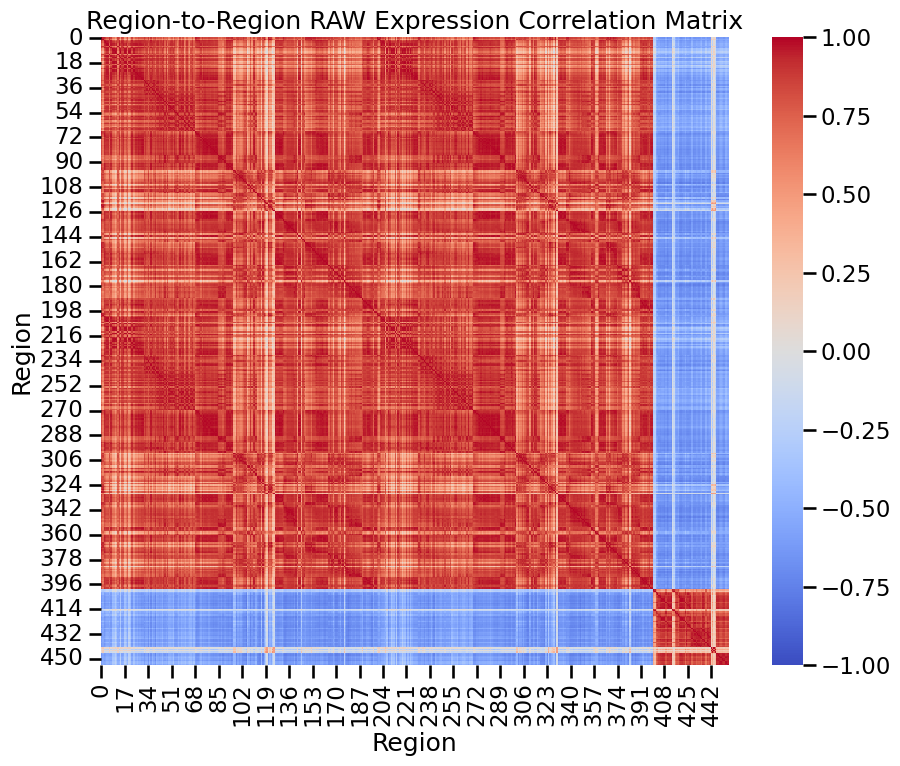

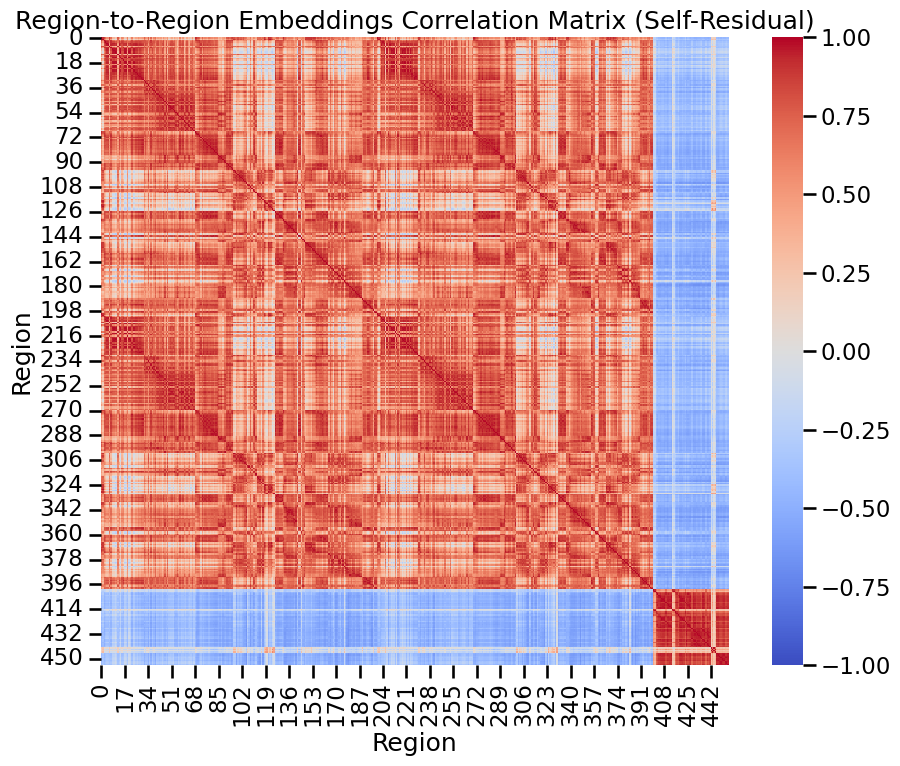

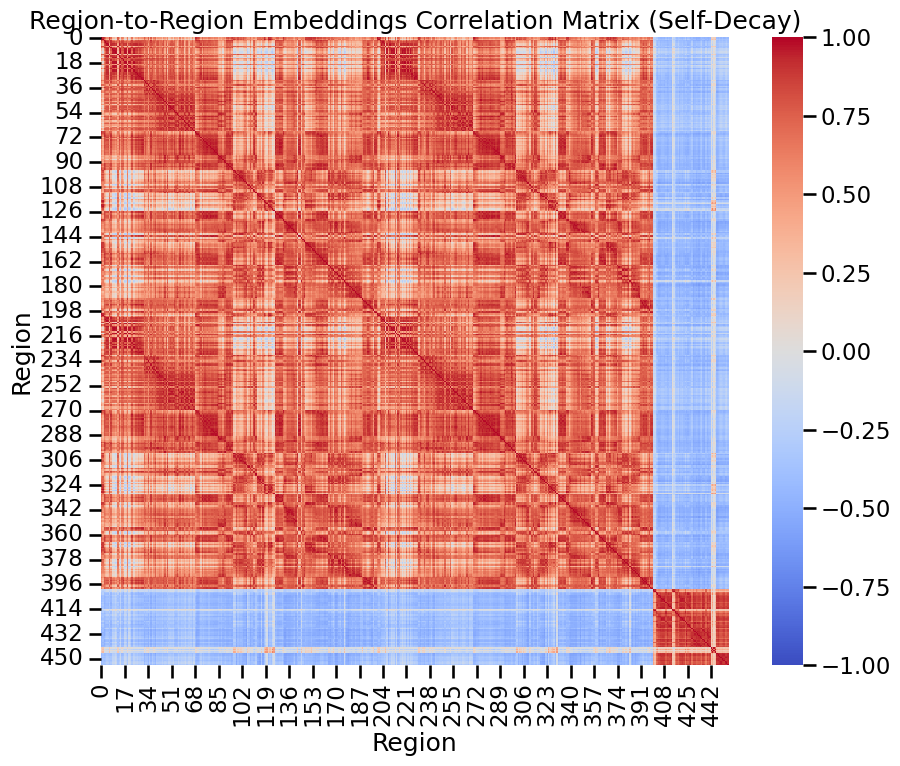

  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")



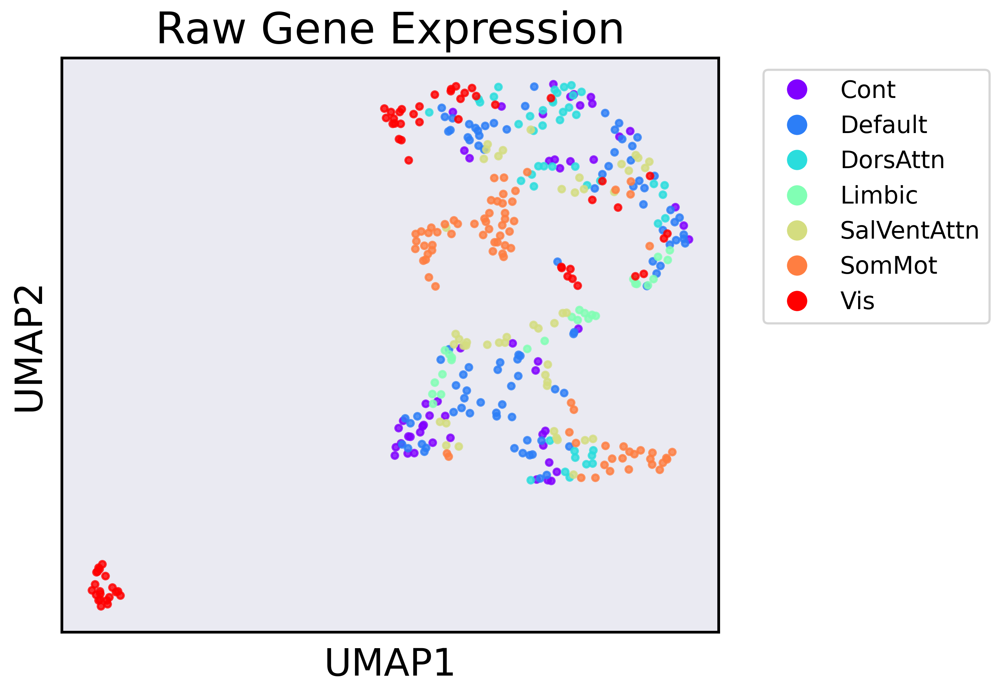

  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")



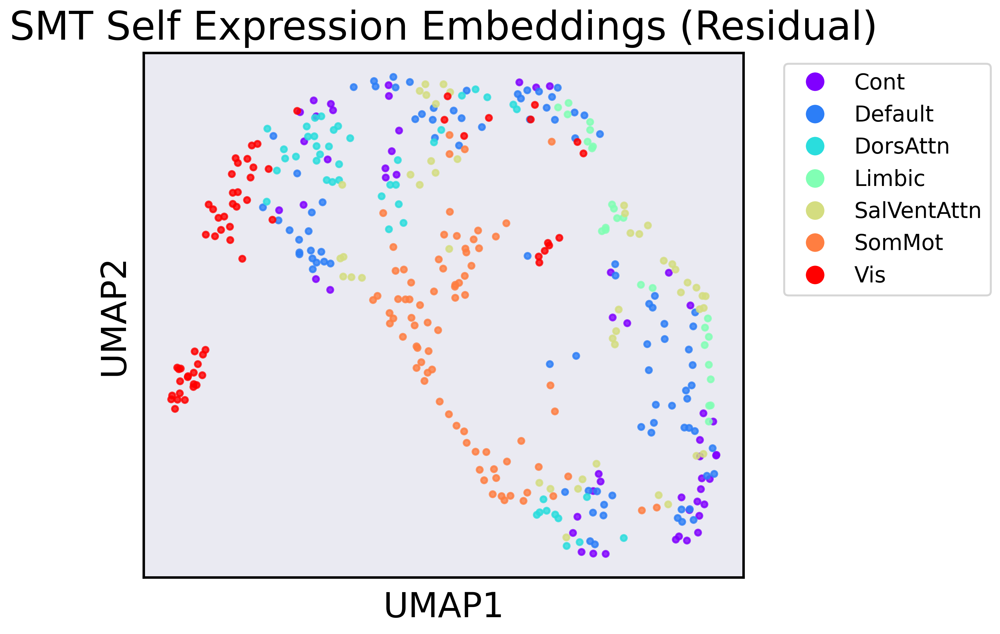

  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")



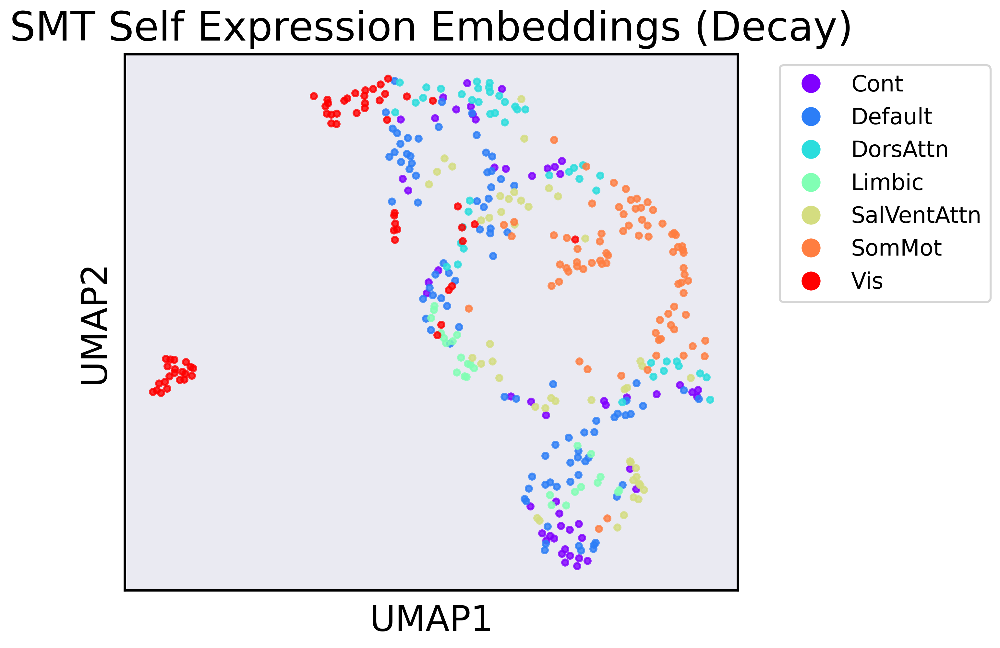

In [30]:
from models.smt_cross import SelfAttentionGeneVecModel

# Create HVG pairwise dataset (if not already created above)
hvg_dataset = RegionPairDataset(
    X=X_hvg_valid,
    Y=Y_valid,
    coords=coords_valid, 
    dataset='HCP',
    parcellation='S456',
    valid2true_mapping=valid2true_mapping,
    valid_genes=valid_genes_hvg
)

# Instantiate both true models
self_attention_residual = SelfAttentionGeneVecModel(
    input_dim=X_hvg.shape[1],
    region_pair_dataset=hvg_dataset,
    expression_bins=100,
    genevec_type='one_hot',
    d_model=32,
    nhead=2,
    num_layers=2,
    deep_hidden_dims=[256, 128, 64],
    pooling_mode='linear',
    use_alibi=True,
    transformer_dropout=0.1,
    dropout_rate=0.1,
    learning_rate=0.00009,
    weight_decay=0.00001
).to('cuda')

self_attention_decay = SelfAttentionGeneVecModel(
    input_dim=X_hvg.shape[1],
    region_pair_dataset=hvg_dataset,
    expression_bins=100,
    genevec_type='one_hot',
    d_model=32,
    nhead=2,
    num_layers=2,
    deep_hidden_dims=[256, 128, 64],
    pooling_mode='linear',
    use_alibi=True,
    transformer_dropout=0.1,
    dropout_rate=0.1,
    learning_rate=0.00009,
    weight_decay=0.00001
).to('cuda')

# Instantiate both null models
self_attention_residual_null = SelfAttentionGeneVecModel(
    input_dim=X_hvg.shape[1],
    region_pair_dataset=hvg_dataset,
    expression_bins=100,
    genevec_type='one_hot',
    d_model=32,
    nhead=2,
    num_layers=2,
    deep_hidden_dims=[256, 128, 64],
    pooling_mode='linear',
    use_alibi=True,
    transformer_dropout=0.1,
    dropout_rate=0.1,
    learning_rate=0.00009,
    weight_decay=0.00001
).to('cuda')

self_attention_decay_null = SelfAttentionGeneVecModel(
    input_dim=X_hvg.shape[1],
    region_pair_dataset=hvg_dataset,
    expression_bins=100,
    genevec_type='one_hot',
    d_model=32,
    nhead=2,
    num_layers=2,
    deep_hidden_dims=[256, 128, 64],
    pooling_mode='linear',
    use_alibi=True,
    transformer_dropout=0.1,
    dropout_rate=0.1,
    learning_rate=0.00009,
    weight_decay=0.00001
).to('cuda')

# Load saved weights
self_attention_residual.load_state_dict(torch.load('models/saved_models/HCP_self_residual.pt'))
self_attention_decay.load_state_dict(torch.load('models/saved_models/HCP_self_decay.pt'))

import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import torch
from data.data_viz import plot_coords_w_fc, plot_umap_embeddings_w_fc

# Prepare for embedding extraction
embeddings_residual = None
embeddings_decay = None
raw_expr = None

with torch.no_grad():
    for batch in dataloader_hvg:
        gene_expr_i = batch[0].to('cuda')
        # Both residual and decay use the same input batch
        emb_residual = self_attention_residual.encoder(gene_expr_i, gene_expr_i).cpu().numpy()
        emb_decay = self_attention_decay.encoder(gene_expr_i, gene_expr_i).cpu().numpy()
        # do some slicing to account for pairwise
        embeddings_residual = emb_residual[:, :100] if emb_residual.shape[1] >= 100 else emb_residual
        embeddings_decay = emb_decay[:, :100] if emb_decay.shape[1] >= 100 else emb_decay
        raw_expr = gene_expr_i.cpu().numpy()
        break  # Only extract one batch

print("Residual embedding matrix shape:", embeddings_residual.shape)
print("Decay embedding matrix shape:", embeddings_decay.shape)
print("Raw gene expr shape:", raw_expr.shape)

# ---- Raw gene expression correlation matrix ----
corr_matrix_raw = np.corrcoef(raw_expr)

plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix_raw, vmin=-1, vmax=1, cmap='coolwarm', square=True)
plt.title("Region-to-Region RAW Expression Correlation Matrix")
plt.xlabel("Region")
plt.ylabel("Region")
plt.tight_layout()
plt.show()

# ---- Residual embedding correlation matrix ----
corr_matrix_residual = np.corrcoef(embeddings_residual)
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix_residual, vmin=-1, vmax=1, cmap='coolwarm', square=True)
plt.title("Region-to-Region Embeddings Correlation Matrix (Self-Residual)")
plt.xlabel("Region")
plt.ylabel("Region")
plt.tight_layout()
plt.show()

# ---- Decay embedding correlation matrix ----
corr_matrix_decay = np.corrcoef(embeddings_decay)
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix_decay, vmin=-1, vmax=1, cmap='coolwarm', square=True)
plt.title("Region-to-Region Embeddings Correlation Matrix (Self-Decay)")
plt.xlabel("Region")
plt.ylabel("Region")
plt.tight_layout()
plt.show()

# ---- UMAP/Embedding Visualizations ----

plot_umap_embeddings_w_fc(
    raw_expr, 
    network_labels, 
    conn_matrix=Y_valid, 
    title="Raw Gene Expression",  
    omit_subcortical=True, 
    edge_alpha=0.3, 
    edge_width=0.5, 
    enhance_legend=False
)

plot_umap_embeddings_w_fc(
    embeddings_residual, 
    network_labels, 
    conn_matrix=Y_valid, 
    title="SMT Self Expression Embeddings (Residual)", 
    omit_subcortical=True, 
    edge_alpha=0.3, 
    edge_width=0.5, 
    enhance_legend=False
)

plot_umap_embeddings_w_fc(
    embeddings_decay, 
    network_labels, 
    conn_matrix=Y_valid, 
    title="SMT Self Expression Embeddings (Decay)", 
    omit_subcortical=True, 
    edge_alpha=0.3, 
    edge_width=0.5, 
    enhance_legend=False
)


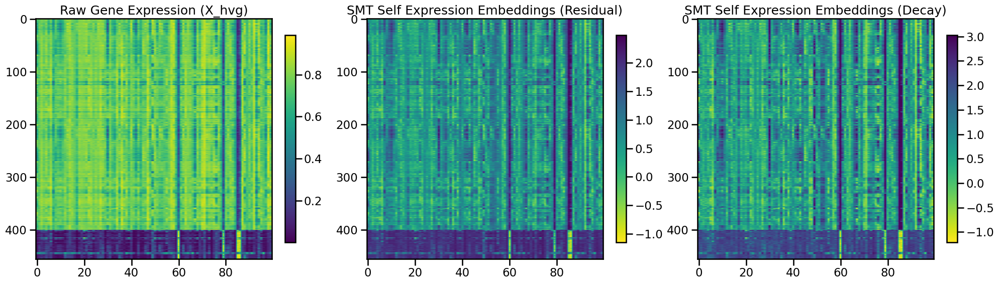

In [31]:
fig, axs = plt.subplots(1, 3, figsize=(20, 6))

# Plot: 0 - X_hvg, 1 - embeddings_residual, 2 - embeddings_decay

# Plot Raw Gene Expression (X_hvg), ensure numpy
im0 = axs[0].imshow(X_hvg.detach().cpu().numpy() if hasattr(X_hvg, "detach") else X_hvg, aspect='auto', cmap='viridis')
axs[0].set_title("Raw Gene Expression (X_hvg)")
plt.colorbar(im0, ax=axs[0], fraction=0.04)

# Plot SMT Self Expression Embeddings (Residual), ensure numpy (move to middle)
im1 = axs[1].imshow(embeddings_residual.detach().cpu().numpy() if hasattr(embeddings_residual, "detach") else embeddings_residual, aspect='auto', cmap='viridis_r')
axs[1].set_title("SMT Self Expression Embeddings (Residual)")
plt.colorbar(im1, ax=axs[1], fraction=0.04)

# Plot SMT Self Expression Embeddings (Decay), ensure numpy (move to right)
im2 = axs[2].imshow(embeddings_decay.detach().cpu().numpy() if hasattr(embeddings_decay, "detach") else embeddings_decay, aspect='auto', cmap='viridis_r')
axs[2].set_title("SMT Self Expression Embeddings (Decay)")
plt.colorbar(im2, ax=axs[2], fraction=0.04)

plt.tight_layout()
plt.show()

Null residual embedding matrix shape: (455, 100)
Null decay embedding matrix shape: (455, 100)
Null raw gene expr shape: (455, 100)


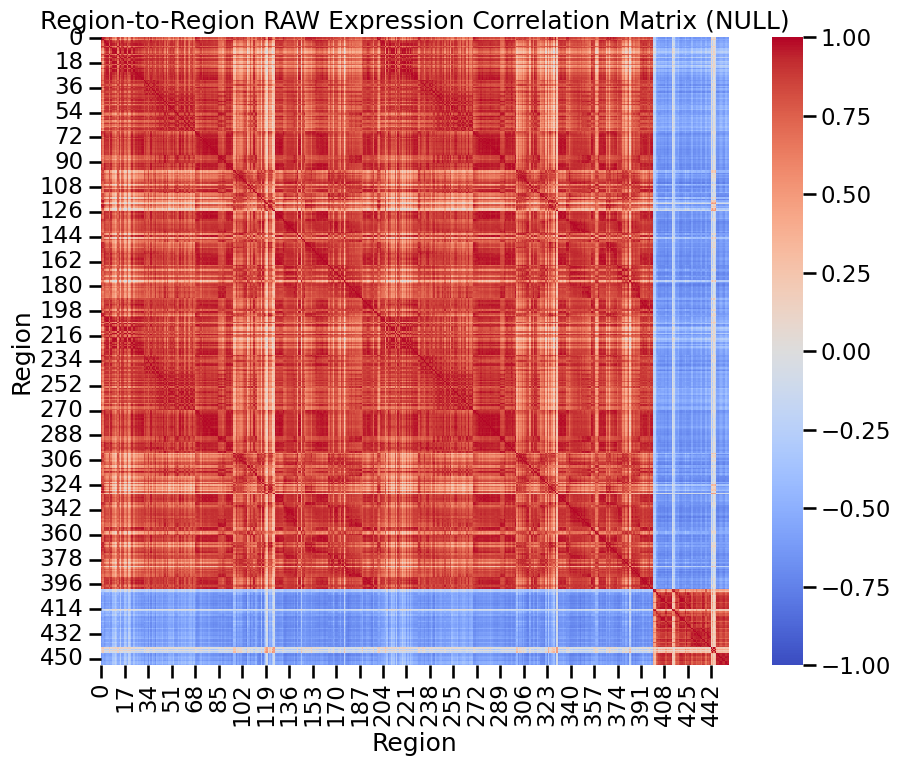

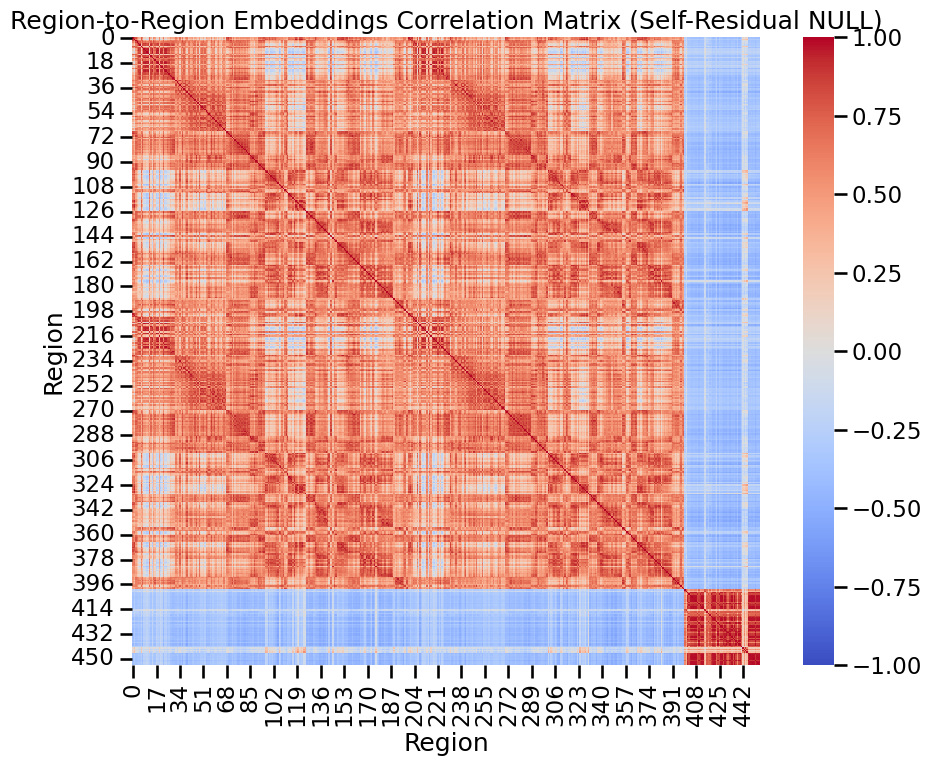

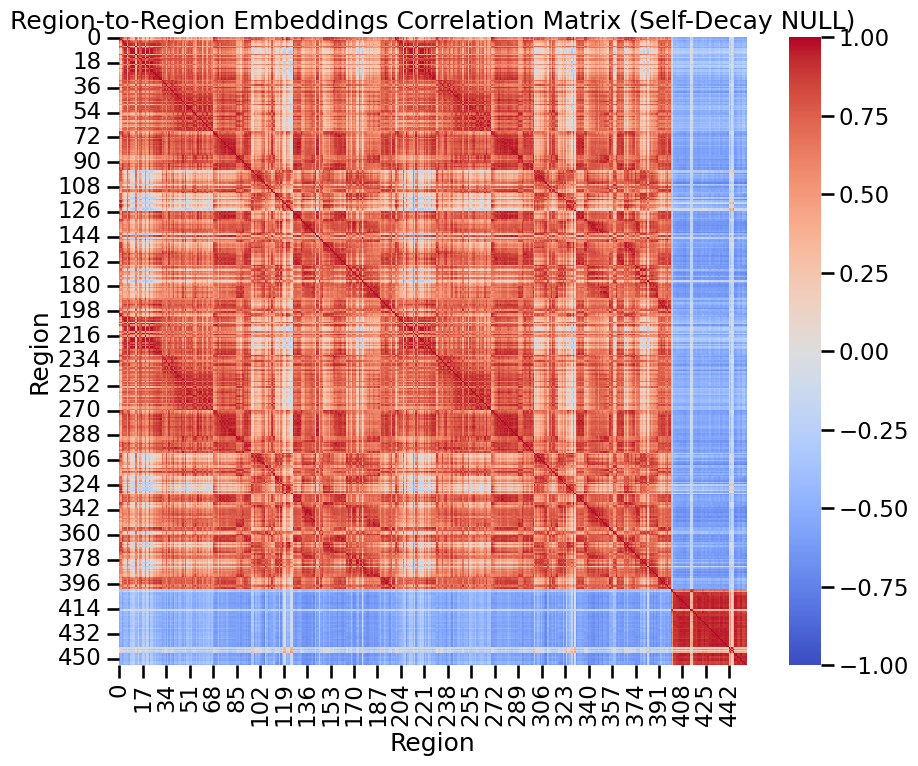

  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")



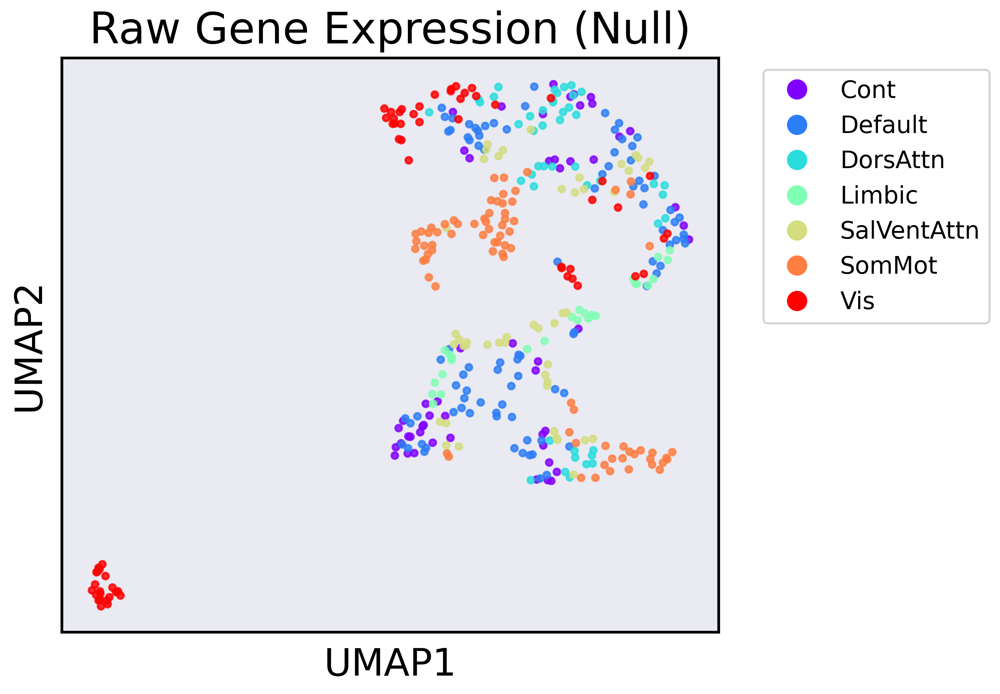

  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")



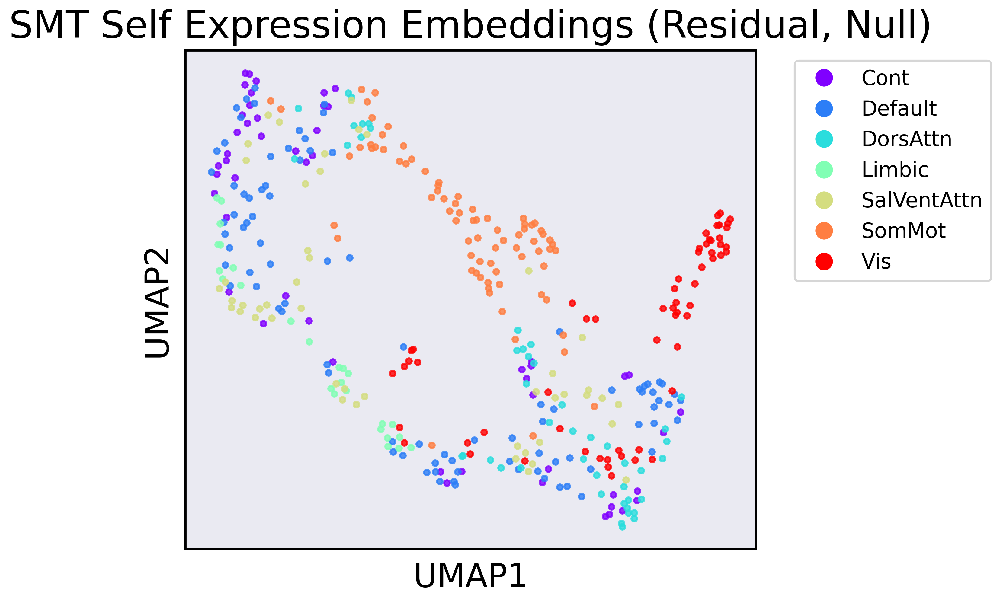

  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")



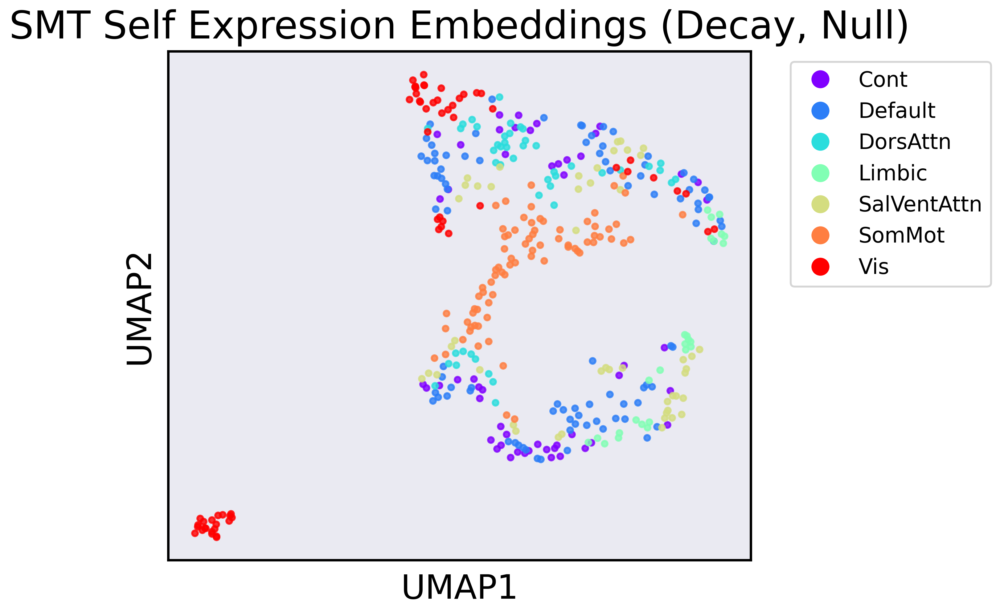

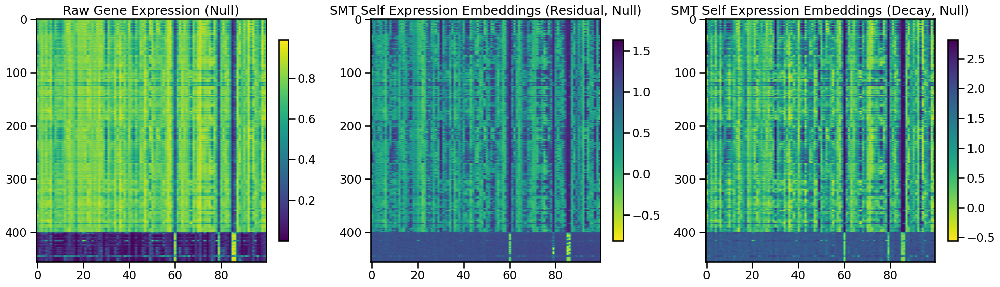

In [32]:
# Update this block for the null models

self_attention_residual_null.load_state_dict(torch.load('models/saved_models/HCP_self_residual_null.pt'))
self_attention_decay_null.load_state_dict(torch.load('models/saved_models/HCP_self_decay_null.pt'))

# Prepare for embedding extraction
embeddings_residual_null = None
embeddings_decay_null = None
raw_expr_null = None

with torch.no_grad():
    for batch in dataloader_hvg:
        gene_expr_i = batch[0].to('cuda')
        # Both residual and decay use the same input batch
        emb_residual_null = self_attention_residual_null.encoder(gene_expr_i, gene_expr_i).cpu().numpy()
        emb_decay_null = self_attention_decay_null.encoder(gene_expr_i, gene_expr_i).cpu().numpy()
        # do some slicing to account for pairwise
        embeddings_residual_null = emb_residual_null[:, :100] if emb_residual_null.shape[1] >= 100 else emb_residual_null
        embeddings_decay_null = emb_decay_null[:, :100] if emb_decay_null.shape[1] >= 100 else emb_decay_null
        raw_expr_null = gene_expr_i.cpu().numpy()
        break  # Only extract one batch

print("Null residual embedding matrix shape:", embeddings_residual_null.shape)
print("Null decay embedding matrix shape:", embeddings_decay_null.shape)
print("Null raw gene expr shape:", raw_expr_null.shape)

# ---- Raw gene expression correlation matrix (NULL) ----
corr_matrix_raw_null = np.corrcoef(raw_expr_null)

plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix_raw_null, vmin=-1, vmax=1, cmap='coolwarm', square=True)
plt.title("Region-to-Region RAW Expression Correlation Matrix (NULL)")
plt.xlabel("Region")
plt.ylabel("Region")
plt.tight_layout()
plt.show()

# ---- Residual embedding correlation matrix (NULL) ----
corr_matrix_residual_null = np.corrcoef(embeddings_residual_null)
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix_residual_null, vmin=-1, vmax=1, cmap='coolwarm', square=True)
plt.title("Region-to-Region Embeddings Correlation Matrix (Self-Residual NULL)")
plt.xlabel("Region")
plt.ylabel("Region")
plt.tight_layout()
plt.show()

# ---- Decay embedding correlation matrix (NULL) ----
corr_matrix_decay_null = np.corrcoef(embeddings_decay_null)
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix_decay_null, vmin=-1, vmax=1, cmap='coolwarm', square=True)
plt.title("Region-to-Region Embeddings Correlation Matrix (Self-Decay NULL)")
plt.xlabel("Region")
plt.ylabel("Region")
plt.tight_layout()
plt.show()

# ---- UMAP/Embedding Visualizations (NULL) ----

plot_umap_embeddings_w_fc(
    raw_expr_null, 
    network_labels, 
    conn_matrix=Y_valid, 
    title="Raw Gene Expression (Null)",  
    omit_subcortical=True, 
    edge_alpha=0.3, 
    edge_width=0.5, 
    enhance_legend=False
)

plot_umap_embeddings_w_fc(
    embeddings_residual_null, 
    network_labels, 
    conn_matrix=Y_valid, 
    title="SMT Self Expression Embeddings (Residual, Null)", 
    omit_subcortical=True, 
    edge_alpha=0.3, 
    edge_width=0.5, 
    enhance_legend=False
)

plot_umap_embeddings_w_fc(
    embeddings_decay_null, 
    network_labels, 
    conn_matrix=Y_valid, 
    title="SMT Self Expression Embeddings (Decay, Null)", 
    omit_subcortical=True, 
    edge_alpha=0.3, 
    edge_width=0.5, 
    enhance_legend=False
)

fig, axs = plt.subplots(1, 3, figsize=(20, 6))

# Plot: 0 - X_hvg (null raw expr), 1 - embeddings_residual_null, 2 - embeddings_decay_null

# Plot Raw Gene Expression (null), ensure numpy
im0 = axs[0].imshow(raw_expr_null, aspect='auto', cmap='viridis')
axs[0].set_title("Raw Gene Expression (Null)")
plt.colorbar(im0, ax=axs[0], fraction=0.04)

# Plot SMT Self Expression Embeddings (Residual null), ensure numpy (middle)
im1 = axs[1].imshow(embeddings_residual_null, aspect='auto', cmap='viridis_r')
axs[1].set_title("SMT Self Expression Embeddings (Residual, Null)")
plt.colorbar(im1, ax=axs[1], fraction=0.04)

# Plot SMT Self Expression Embeddings (Decay null), ensure numpy (right)
im2 = axs[2].imshow(embeddings_decay_null, aspect='auto', cmap='viridis_r')
axs[2].set_title("SMT Self Expression Embeddings (Decay, Null)")
plt.colorbar(im2, ax=axs[2], fraction=0.04)

plt.tight_layout()
plt.show()


In [17]:
from sklearn.decomposition import PCA
import numpy as np
from scipy.stats import pearsonr
import matplotlib.pyplot as plt

def analyze_embedding_pc_similarity(embeddings_decay, embeddings_residual, n_pc=20, verbose=True):
    """
    Perform PCA on two embedding arrays and compute per-PC Pearson similarity.

    Args:
        embeddings_decay: np.ndarray or torch.Tensor [n_regions, n_features]
        embeddings_residual: np.ndarray or torch.Tensor [n_regions, n_features]
        n_pc: int, number of PCs to compute (default 20)
        verbose: bool, if True, print summary

    Returns:
        dict with keys:
            'decay_pcs': [n_regions, n_pc] ndarray of decay PCs
            'residual_pcs': [n_regions, n_pc] ndarray of residual PCs
            'n_pcs_decay_95': int, # of decay PCs explaining >=95% var
            'n_pcs_residual_95': int, # of residual PCs explaining >=95% var
            'pc_similarities': list of Pearson r for each PC
    """
    # Ensure numpy arrays
    decay_np = embeddings_decay.detach().cpu().numpy() if hasattr(embeddings_decay, "detach") else np.array(embeddings_decay)
    residual_np = embeddings_residual.detach().cpu().numpy() if hasattr(embeddings_residual, "detach") else np.array(embeddings_residual)

    # Fit PCA (n_pc components)
    pca_decay = PCA(n_components=n_pc)
    pca_res = PCA(n_components=n_pc)

    decay_pcs = pca_decay.fit_transform(decay_np)
    residual_pcs = pca_res.fit_transform(residual_np)

    # Output how many PCs explain 95% of variance
    def num_pcs_95var(pca_obj):
        explained = np.cumsum(pca_obj.explained_variance_ratio_)
        return np.searchsorted(explained, 0.95) + 1  # +1 for count not index

    n_pcs_decay_95 = num_pcs_95var(pca_decay)
    n_pcs_residual_95 = num_pcs_95var(pca_res)

    if verbose:
        print(f"Decay embeddings: {n_pcs_decay_95} PCs explain >=95% of variance")
        print(f"Residual embeddings: {n_pcs_residual_95} PCs explain >=95% of variance")

    # Compute similarity (Pearson correlation) for each PC: 1 vs 1, 2 vs 2, etc.
    pc_similarities = []
    for i in range(n_pc):
        pc_decay = decay_pcs[:, i]
        pc_residual = residual_pcs[:, i]
        corr, _ = pearsonr(pc_decay, pc_residual)
        pc_similarities.append(corr)

    if verbose:
        for idx, sim in enumerate(pc_similarities, 1):
            print(f"PC {idx} similarity (Pearson r): {sim:.4f}")

    results = {
        "decay_pcs": decay_pcs,
        "residual_pcs": residual_pcs,
        "n_pcs_decay_95": n_pcs_decay_95,
        "n_pcs_residual_95": n_pcs_residual_95,
        "pc_similarities": pc_similarities,
    }
    return results


Decay embeddings: 13 PCs explain >=95% of variance
Residual embeddings: 11 PCs explain >=95% of variance
PC 1 similarity (Pearson r): 0.9986
PC 2 similarity (Pearson r): 0.9970
PC 3 similarity (Pearson r): 0.9898
PC 4 similarity (Pearson r): 0.9690
PC 5 similarity (Pearson r): -0.9665
PC 6 similarity (Pearson r): 0.9737
PC 7 similarity (Pearson r): 0.9677
PC 8 similarity (Pearson r): 0.9717
PC 9 similarity (Pearson r): -0.3934
PC 10 similarity (Pearson r): 0.4322
PC 11 similarity (Pearson r): -0.8739
PC 12 similarity (Pearson r): 0.9139


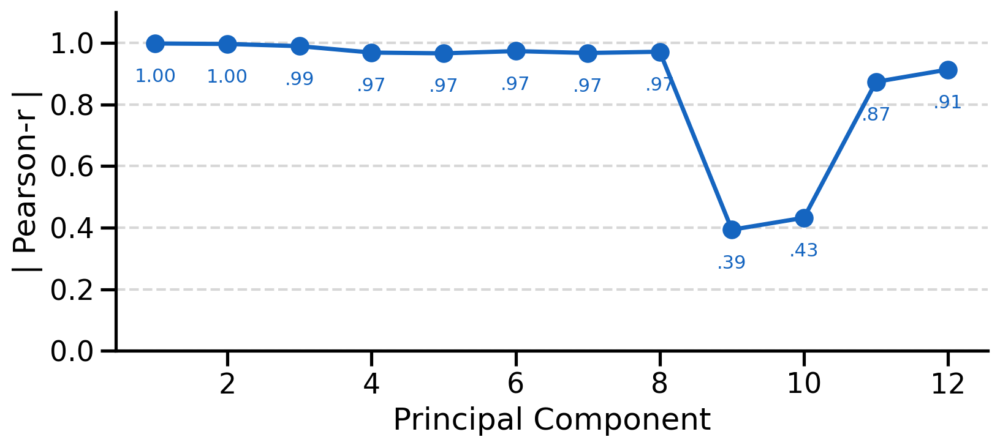

Decay embeddings: 12 PCs explain >=95% of variance
Residual embeddings: 13 PCs explain >=95% of variance
PC 1 similarity (Pearson r): 0.9964
PC 2 similarity (Pearson r): 0.9925
PC 3 similarity (Pearson r): 0.9760
PC 4 similarity (Pearson r): 0.9452
PC 5 similarity (Pearson r): -0.8948
PC 6 similarity (Pearson r): 0.8923
PC 7 similarity (Pearson r): -0.8551
PC 8 similarity (Pearson r): 0.7938
PC 9 similarity (Pearson r): -0.5058
PC 10 similarity (Pearson r): 0.4623
PC 11 similarity (Pearson r): 0.5530
PC 12 similarity (Pearson r): 0.4770


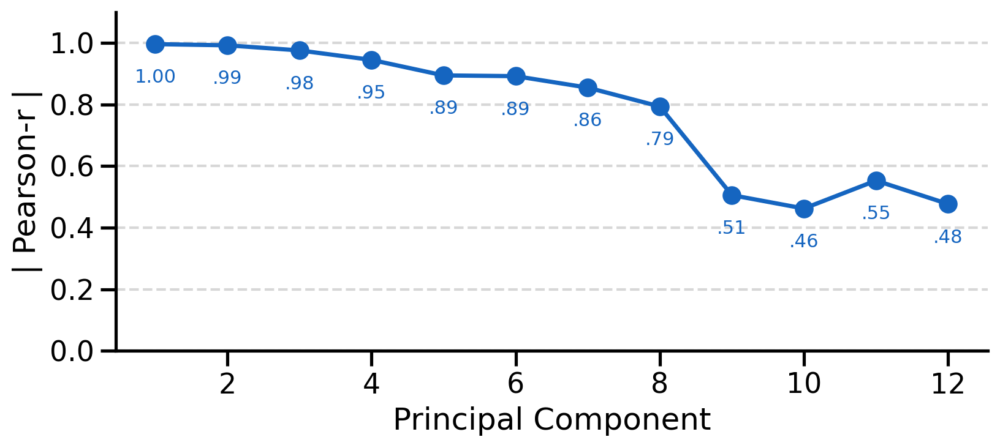

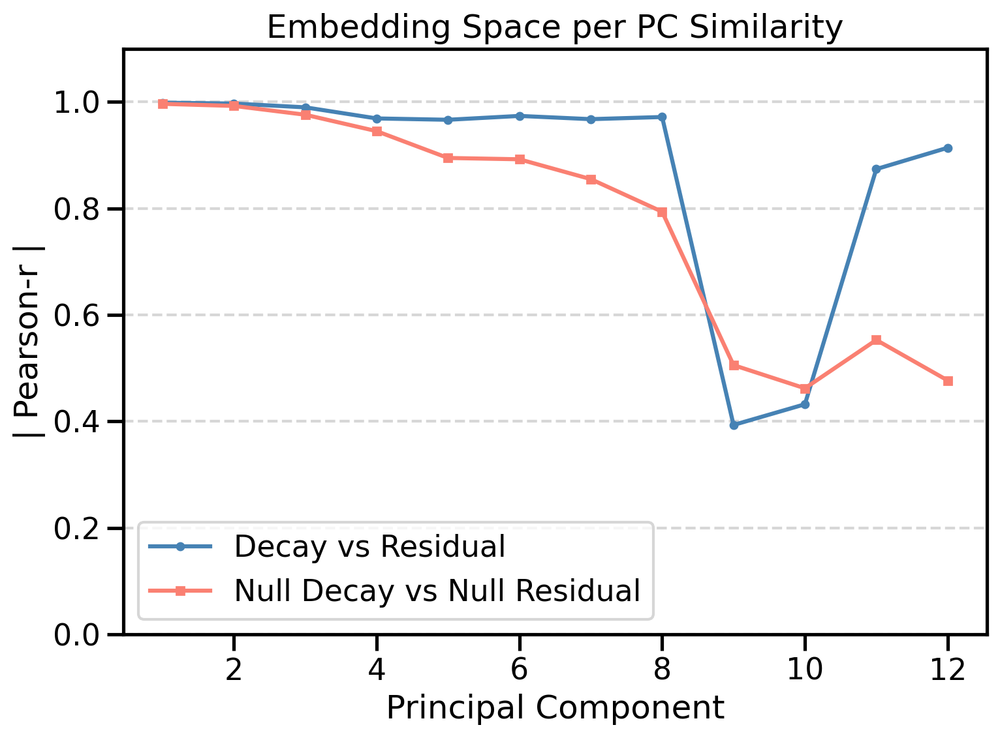

In [33]:
# Plot the absolute value of PC correlations as a line plot
def plot_pc_similarities(pc_similarities, figsize=(8.5, 4), dpi=200, title='Embedding Space per PC Similarity'):
    abs_pc_corrs = np.abs(pc_similarities)
    fig, ax = plt.subplots(figsize=figsize, dpi=dpi)
    x_vals = np.arange(1, len(abs_pc_corrs) + 1)
    # Thicker, more blue line and bigger points
    ax.plot(x_vals, abs_pc_corrs, marker='o', markersize=10, color='#1565c0', linewidth=2.5)
    ax.set_xlabel('Principal Component')
    ax.set_ylabel('| Pearson-r |')
    #ax.set_title(title)
    ax.set_ylim(0, 1.1)  # Set y-axis from 0 to a bit above 1.0
    ax.set_yticks(np.arange(0, 1.01, 0.2))  # Y-ticks every 0.2 from 0 to 1.0
    ax.grid(True, axis='y', linestyle='--', alpha=0.5)
    # Annotate the value under each point
    for x, y in zip(x_vals, abs_pc_corrs):
        formatted_y = f"{y:.2f}".lstrip('0') if y != 0 else "0.00"
        ax.text(x, y - 0.08, formatted_y, ha='center', va='top', fontsize=11, color='#1565c0')
    # Remove top and right spines (the black boundaries)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    plt.tight_layout()
    plt.show()

pc_analysis = analyze_embedding_pc_similarity(embeddings_decay, embeddings_residual, n_pc=12, verbose=True)
plot_pc_similarities(pc_analysis['pc_similarities'])

pc_analysis_null = analyze_embedding_pc_similarity(embeddings_decay_null, embeddings_residual_null, n_pc=12, verbose=True)
plot_pc_similarities(pc_analysis_null['pc_similarities'])

plt.figure(figsize=(8, 6), dpi=200)
abs_pc_corrs = np.abs(pc_analysis['pc_similarities'])
abs_pc_corrs_null = np.abs(pc_analysis_null['pc_similarities'])
plt.plot(range(1, len(abs_pc_corrs) + 1), abs_pc_corrs, marker='o', markersize=4, color='steelblue', label='Decay vs Residual')
plt.plot(range(1, len(abs_pc_corrs_null) + 1), abs_pc_corrs_null, marker='s', markersize=4, color='salmon', label='Null Decay vs Null Residual')
plt.xlabel('Principal Component')
plt.ylabel('| Pearson-r |')
plt.title('Embedding Space per PC Similarity')
plt.ylim(0, 1.1)
plt.yticks(np.arange(0, 1.01, 0.2))
plt.grid(True, axis='y', linestyle='--', alpha=0.5)
plt.legend()
plt.tight_layout()
plt.show()



In [12]:
os.environ["NILEARN_DATA"] = "/scratch/asr655/neuroinformatics/GeneEx2Conn/data/nilearn_data"
from brainmontage import brainmontage
from brainmontage import create_montage_figure, save_image
from nilearn import datasets as nldatasets
import matplotlib.colors as mcolors


# Patch just the fetch_surf_fsaverage call to set data_dir properly
_original_fetch_surf = nldatasets.fetch_surf_fsaverage

def _patched_fetch_surf_fsaverage(*args, **kwargs):
    kwargs['data_dir'] = "/scratch/asr655/neuroinformatics/GeneEx2Conn/data/nilearn_data"
    return _original_fetch_surf(*args, **kwargs)

nldatasets.fetch_surf_fsaverage = _patched_fetch_surf_fsaverage

  warn(

  warn(



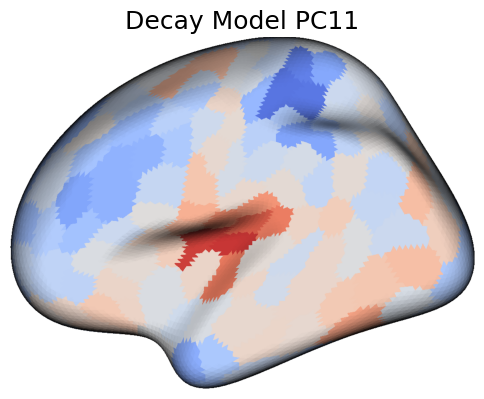

In [15]:
# Plot a given Principal Component (PC) on the brain for both residual and decay models
pc_index = 10  # Change this to plot a different PC (0-based index)

# roi_vals for residual and decay models: respectively residual_pcs[:, pc_index] and decay_pcs[:, pc_index]
# decay_pcs and residual_pcs assumed from earlier code at lines ~60-61

# Plot decay model PC
img_decay = create_montage_figure(
    roivals=pc_analysis['decay_pcs'][:400, pc_index],
    atlasname='schaefer400',
    viewnames='lateral',
    surftype='infl',
    hemis='left',
    no_lookup=True,
    backgroundcolor='white',
    colormap='coolwarm',
    upscale_factor=4,
    face_mode='best',
    add_colorbar=False,
    #colorbar_label=f'Decay Model PC{pc_index+1}'
)

plt.figure(figsize=(6, 6))
plt.imshow(img_decay)
plt.axis('off')
plt.title(f"Decay Model PC{pc_index+1}")
plt.show()

# # Plot residual model PC
# img_residual = create_montage_figure(
#     roivals=pc_analysis['residual_pcs'][:400, pc_index],
#     atlasname='schaefer400',
#     viewnames='all',
#     surftype='infl',
#     hemis='both',
#     no_lookup=True,
#     backgroundcolor='white',
#     colormap='coolwarm',
#     upscale_factor=4,
#     face_mode='best',
#     add_colorbar=True,
#     colorbar_label=f'Residual Model PC{pc_index+1}'
# )

# plt.figure(figsize=(6, 6))
# plt.imshow(img_residual)
# plt.axis('off')
# plt.title(f"Residual Model PC{pc_index+1}")
# plt.show()

In [16]:
# Plot and save PC 1-12 for both decay and residual models (lateral style)

import os

output_dir = "pc_montage_figures_lateral"
os.makedirs(output_dir, exist_ok=True)

for pc_index in range(12):  # PC 1-12 (0-based indices 0-11)
    # Plot decay model PC, lateral view, left hemi only, no colorbar
    img_decay = create_montage_figure(
        roivals=pc_analysis['decay_pcs'][:400, pc_index],
        atlasname='schaefer400',
        viewnames='lateral',
        surftype='infl',
        hemis='left',
        no_lookup=True,
        backgroundcolor='white',
        colormap='coolwarm',
        upscale_factor=4,
        face_mode='best',
        add_colorbar=False
    )

    plt.figure(figsize=(6, 6))
    plt.imshow(img_decay)
    plt.axis('off')
    plt.title(f"Decay Model PC{pc_index+1}")
    plt.tight_layout()
    decay_filename = os.path.join(output_dir, f"decay_model_PC{pc_index+1}_lateral.png")
    plt.savefig(decay_filename, bbox_inches='tight', pad_inches=0.1, dpi=200)
    plt.close()

    # Plot residual model PC, lateral view, left hemi only, no colorbar
    img_residual = create_montage_figure(
        roivals=pc_analysis['residual_pcs'][:400, pc_index],
        atlasname='schaefer400',
        viewnames='lateral',
        surftype='infl',
        hemis='left',
        no_lookup=True,
        backgroundcolor='white',
        colormap='coolwarm',
        upscale_factor=4,
        face_mode='best',
        add_colorbar=False
    )

    plt.figure(figsize=(6, 6))
    plt.imshow(img_residual)
    plt.axis('off')
    plt.title(f"Residual Model PC{pc_index+1}")
    plt.tight_layout()
    residual_filename = os.path.join(output_dir, f"residual_model_PC{pc_index+1}_lateral.png")
    plt.savefig(residual_filename, bbox_inches='tight', pad_inches=0.1, dpi=200)
    plt.close()

print(f"Saved lateral montage figures for PCs 1-12 in '{output_dir}' directory.")

  warn(

  warn(

  warn(

  warn(

  warn(

  warn(

  warn(

  warn(

  warn(

  warn(

  warn(

  warn(

  warn(

  warn(

  warn(

  warn(

  warn(

  warn(

  warn(

  warn(

  warn(

  warn(

  warn(

  warn(

  warn(

  warn(

  warn(

  warn(

  warn(

  warn(

  warn(

  warn(

  warn(

  warn(

  warn(

  warn(

  warn(

  warn(

  warn(

  warn(

  warn(

  warn(

  warn(

  warn(

  warn(

  warn(

  warn(

  warn(



Saved lateral montage figures for PCs 1-12 in 'pc_montage_figures_lateral' directory.


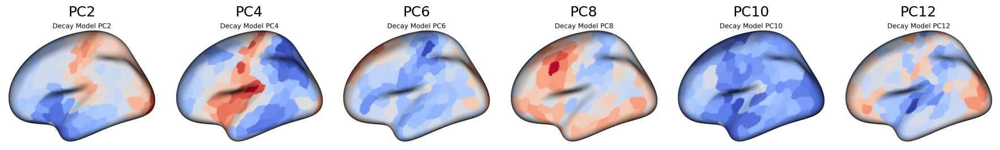

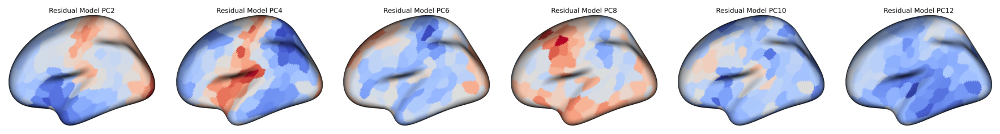

In [22]:
import matplotlib.pyplot as plt
import os
from PIL import Image

def plot_every_other_pcs(start_index=0, n_pcs=12):
    """
    Plot every other PC image from a desired starting index.
    
    Args:
        start_index (int): The starting PC index (0-based).
        n_pcs (int): The total number of PCs available.
    """
    lateral_dir = "pc_montage_figures_lateral"
    decay_pattern = "decay_model_PC{}_lateral.png"
    residual_pattern = "residual_model_PC{}_lateral.png"

    # Get indices to plot: start at start_index, step by 2
    pcs_to_plot = list(range(start_index, n_pcs, 2))
    n_plot = len(pcs_to_plot)

    # Plot decay images in a row
    fig_decay, axes_decay = plt.subplots(1, n_plot, figsize=(3*n_plot, 3))
    if n_plot == 1:
        axes_decay = [axes_decay]
    for ax, i in zip(axes_decay, pcs_to_plot):
        img_path = os.path.join(lateral_dir, decay_pattern.format(i+1))
        img = Image.open(img_path)
        ax.imshow(img)
        ax.axis('off')
        ax.set_title(f'PC{i+1}')
    #fig_decay.suptitle(f'Decay Model PCs (Lateral Views) - every other from {start_index+1}', fontsize=20)
    plt.tight_layout()
    plt.subplots_adjust(top=0.85)
    plt.show()

    # Plot residual images in a row
    fig_residual, axes_residual = plt.subplots(1, n_plot, figsize=(3*n_plot, 3))
    if n_plot == 1:
        axes_residual = [axes_residual]
    for ax, i in zip(axes_residual, pcs_to_plot):
        img_path = os.path.join(lateral_dir, residual_pattern.format(i+1))
        img = Image.open(img_path)
        ax.imshow(img)
        ax.axis('off')
        #ax.set_title(f'PC{i+1}')
    #fig_residual.suptitle(f'Residual Model PCs (Lateral Views) - every other from {start_index+1}', fontsize=20)
    plt.tight_layout()
    plt.subplots_adjust(top=0.85)
    plt.show()

# Example usage: plot every other from index 0 (the default)
plot_every_other_pcs(start_index=1, n_pcs=12)
# To plot every other from e.g. the second PC (index 1): plot_every_other_pcs(start_index=1, n_pcs=12)


In [22]:
# Plot and save PC 1-12 for both decay and residual models

import os

output_dir = "pc_montage_figures"
os.makedirs(output_dir, exist_ok=True)

for pc_index in range(12):  # PC 1-12 (0-based indices 0-11)
    # Plot decay model PC
    img_decay = create_montage_figure(
        roivals=pc_analysis['decay_pcs'][:400, pc_index],
        atlasname='schaefer400',
        viewnames='all',
        surftype='infl',
        hemis='both',
        no_lookup=True,
        backgroundcolor='white',
        colormap='coolwarm',
        upscale_factor=4,
        face_mode='best',
        add_colorbar=True,
        colorbar_label=f'Decay Model PC{pc_index+1}'
    )

    plt.figure(figsize=(6, 6))
    plt.imshow(img_decay)
    plt.axis('off')
    plt.title(f"Decay Model PC{pc_index+1}")
    plt.tight_layout()
    decay_filename = os.path.join(output_dir, f"decay_model_PC{pc_index+1}.png")
    plt.savefig(decay_filename, bbox_inches='tight', pad_inches=0.1, dpi=200)
    plt.close()

    # Plot residual model PC
    img_residual = create_montage_figure(
        roivals=pc_analysis['residual_pcs'][:400, pc_index],
        atlasname='schaefer400',
        viewnames='all',
        surftype='infl',
        hemis='both',
        no_lookup=True,
        backgroundcolor='white',
        colormap='coolwarm',
        upscale_factor=4,
        face_mode='best',
        add_colorbar=True,
        colorbar_label=f'Residual Model PC{pc_index+1}'
    )

    plt.figure(figsize=(6, 6))
    plt.imshow(img_residual)
    plt.axis('off')
    plt.title(f"Residual Model PC{pc_index+1}")
    plt.tight_layout()
    residual_filename = os.path.join(output_dir, f"residual_model_PC{pc_index+1}.png")
    plt.savefig(residual_filename, bbox_inches='tight', pad_inches=0.1, dpi=200)
    plt.close()

print(f"Saved montage figures for PCs 1-12 in '{output_dir}' directory.")

  warn(

  warn(

  warn(

  warn(

  warn(

  warn(

  warn(

  warn(

  warn(

  warn(

  warn(

  warn(

  warn(

  warn(

  warn(

  warn(

  warn(

  warn(

  warn(

  warn(

  warn(

  warn(

  warn(

  warn(

  warn(

  warn(

  warn(

  warn(

  warn(

  warn(

  warn(

  warn(

  warn(

  warn(

  warn(

  warn(

  warn(

  warn(

  warn(

  warn(

  warn(

  warn(

  warn(

  warn(

  warn(

  warn(

  warn(

  warn(



Saved montage figures for PCs 1-12 in 'pc_montage_figures' directory.


  warn(

  warn(



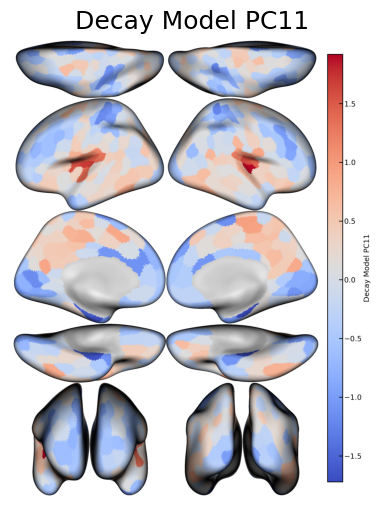

  warn(

  warn(



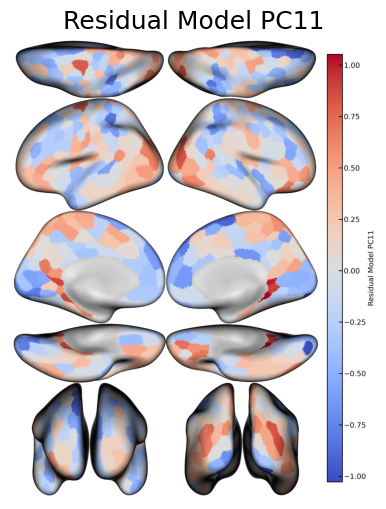

(0.0, 1.0, 0.0, 1.0)

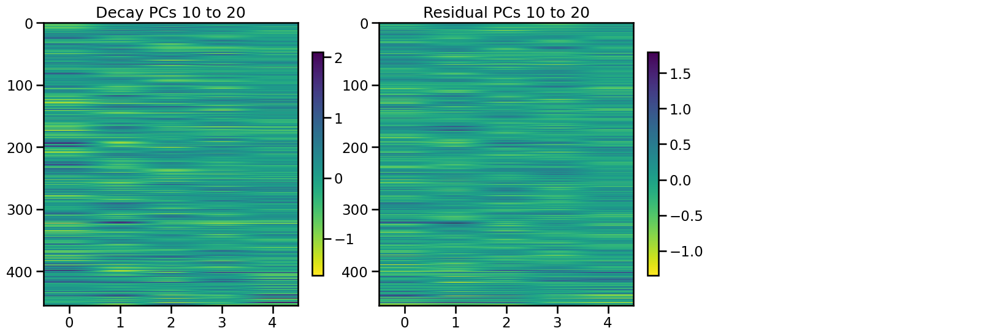

In [ ]:
pc_range = [10, 20]

fig, axs = plt.subplots(1, 3, figsize=(20, 6))

# Plot residual PCs (in the middle axis)
residual_pcs_to_plot = pc_analysis['residual_pcs'][:, pc_range[0]:pc_range[1]]
im_residual = axs[1].imshow(residual_pcs_to_plot, aspect='auto', cmap='viridis_r')
axs[1].set_title(f"Residual PCs {pc_range[0]} to {pc_range[1]}")
plt.colorbar(im_residual, ax=axs[1], fraction=0.04)

# Plot decay PCs (in the left axis as example, can be changed)
decay_pcs_to_plot = pc_analysis['decay_pcs'][:, pc_range[0]:pc_range[1]]
im_decay = axs[0].imshow(decay_pcs_to_plot, aspect='auto', cmap='viridis_r')
axs[0].set_title(f"Decay PCs {pc_range[0]} to {pc_range[1]}")
plt.colorbar(im_decay, ax=axs[0], fraction=0.04)

# (Optional: leave right subplot blank or with custom logic)
axs[2].axis('off')

Resorting genes by expression level
AxesImage(size=(456, 100))


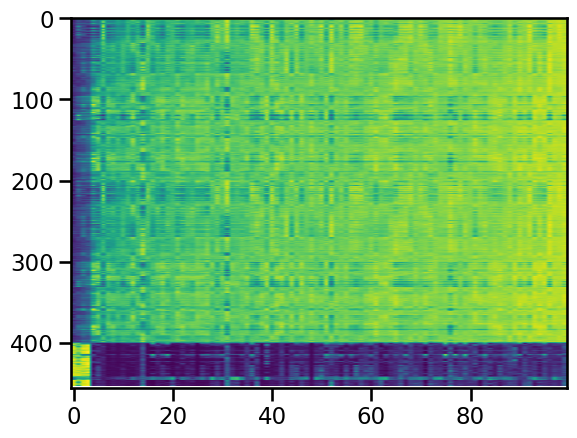

In [ ]:
X_hvg = load_transcriptome(null_model='none', random_seed=1, parcellation='S456', gene_list=hvg_gene_list, hemisphere='both', omit_subcortical=False, sort_genes='expression', impute_strategy='mirror_interpolate', return_valid_genes=False)
print(plt.imshow(X_hvg.detach().cpu().numpy() if hasattr(X_hvg, "detach") else X_hvg, aspect='auto', cmap='viridis'))

Resorting genes by expression level
Spinning gene expression
Spin index for seed 9: 8
Mean error rank for spin index 8: 243.66666666666663
AxesImage(size=(456, 100))


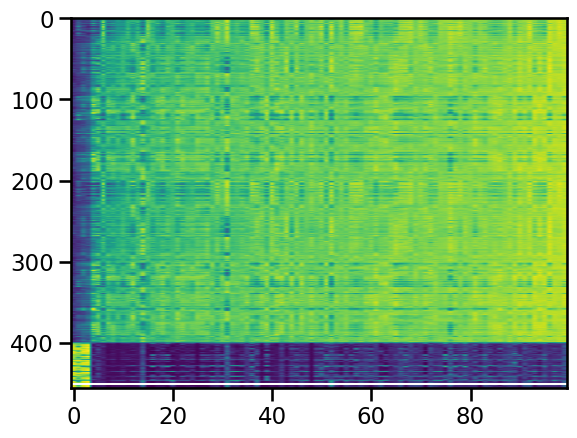

In [ ]:
X_hvg_spin = load_transcriptome(null_model='spin', random_seed=9, parcellation='S456', gene_list=hvg_gene_list, hemisphere='both', omit_subcortical=False, sort_genes='expression', impute_strategy='mirror_interpolate', return_valid_genes=False)
print(plt.imshow(X_hvg_spin.detach().cpu().numpy() if hasattr(X_hvg_spin, "detach") else X_hvg_spin, aspect='auto', cmap='viridis'))

Load all possible models

In [9]:
from models.smt_cross import SelfAttentionGeneVecModel

# Create HVG pairwise dataset
hvg_dataset = RegionPairDataset(
    X=X_hvg_valid,
    Y=Y_valid,
    coords=coords_valid, 
    dataset='UKBB',
    parcellation='S456',
    valid2true_mapping=valid2true_mapping,
    valid_genes=valid_genes_hvg
)

# Load HCP models: base and _cortex variants
hcp_model_names = [
    'HCP_self_decay',
    'HCP_self_residual',
    'HCP_self_full',
    'HCP_self_decay_cortex',
    'HCP_self_residual_cortex',
    'HCP_self_full_cortex',
]

hcp_models = {}

for model_name in hcp_model_names:
    model = SelfAttentionGeneVecModel(
        input_dim=X_hvg.shape[1],
        region_pair_dataset=hvg_dataset,
        expression_bins=100,
        genevec_type='one_hot',
        d_model=32,
        nhead=2,
        num_layers=2,
        deep_hidden_dims=[256, 128, 64],
        pooling_mode='linear',
        use_alibi=True,
        transformer_dropout=0.1,
        dropout_rate=0.1,
        learning_rate=0.00009,
        weight_decay=0.00001
    ).to('cuda')
    
    # Assume the model checkpoints follow the pattern 'models/saved_models/{model_name}.pt'
    checkpoint_path = f'models/saved_models/{model_name}.pt'
    model.load_state_dict(torch.load(checkpoint_path))
    hcp_models[model_name] = model



  warnings.warn(



Using SymmetricLoss with lambda_sym=0.1
Created one-hot embeddings: 100 genes with 100-dimensional embeddings
Using all valid genes for one-hot encoding
Number of learnable parameters in SelfAttentionGeneVec model: 125474
Expression bins: 100
Pooling mode: linear
ROI combination: concat
Using SymmetricLoss with lambda_sym=0.1
Created one-hot embeddings: 100 genes with 100-dimensional embeddings
Using all valid genes for one-hot encoding
Number of learnable parameters in SelfAttentionGeneVec model: 125474
Expression bins: 100
Pooling mode: linear
ROI combination: concat
Using SymmetricLoss with lambda_sym=0.1
Created one-hot embeddings: 100 genes with 100-dimensional embeddings
Using all valid genes for one-hot encoding
Number of learnable parameters in SelfAttentionGeneVec model: 125474
Expression bins: 100
Pooling mode: linear
ROI combination: concat
Using SymmetricLoss with lambda_sym=0.1
Created one-hot embeddings: 100 genes with 100-dimensional embeddings
Using all valid genes for 

Analyze how the SMT-self mini represents each gene

Loaded Gene2Vec embeddings: 94 genes with 200-dimensional embeddings
Gene overlap: 94/100 valid genes have Gene2Vec embeddings


  linkage_matrix = linkage(dist_model, method=method)



Loaded coexpression embeddings: 94 genes with 7380-dimensional embeddings
Using all valid genes for coexpression embeddings


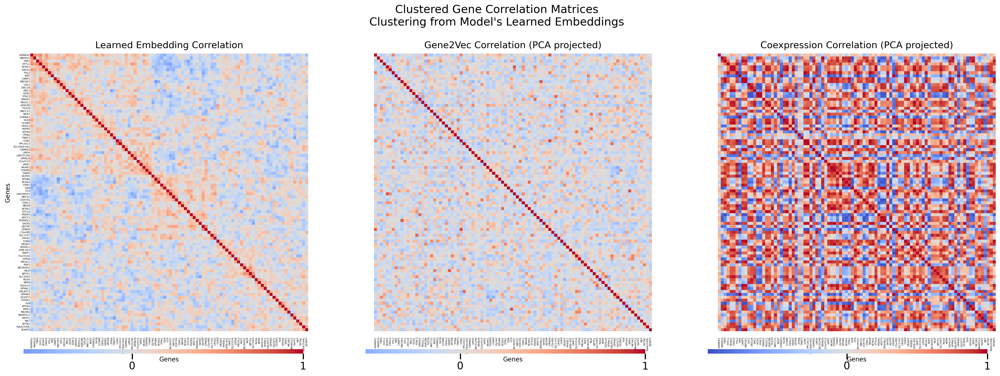

In [11]:
gene_order = plot_gene_correlation_heatmaps_for_model(hcp_models['HCP_self_decay'], valid_genes_hvg, show_dendrogram=False, method="complete", PCA_proj=True, X_hvg=X_hvg.cpu().numpy(), return_gene_order=True)

Loaded Gene2Vec embeddings: 94 genes with 200-dimensional embeddings
Gene overlap: 94/100 valid genes have Gene2Vec embeddings
Loaded coexpression embeddings: 94 genes with 7380-dimensional embeddings
Using all valid genes for coexpression embeddings


  linkage_matrix = linkage(dist_model, method=method)



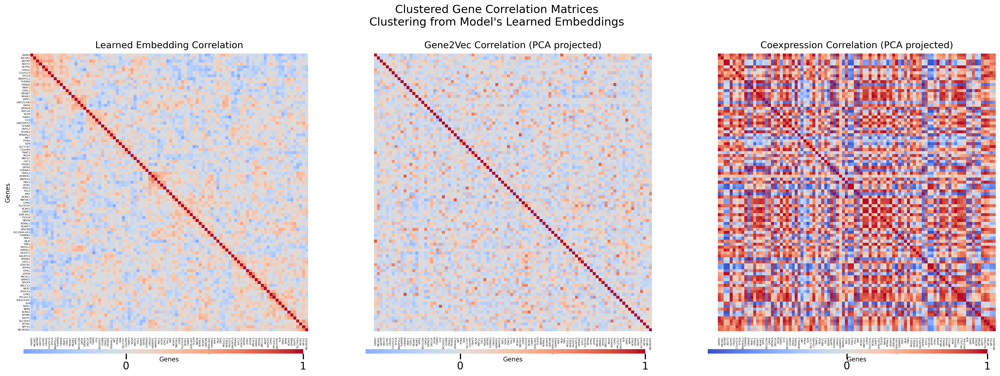

In [12]:
gene_order = plot_gene_correlation_heatmaps_for_model(hcp_models['HCP_self_residual'], valid_genes_hvg, show_dendrogram=False, method="complete", PCA_proj=True, X_hvg=X_hvg.cpu().numpy(), return_gene_order=True)

PLS for interpretability

In [ ]:
full_gene_list='0.2'
hvg_gene_list='100_var'

# Load two versions of gene expression data based on gene lists
X_full, valid_genes_full = load_transcriptome(parcellation='S456', gene_list=full_gene_list, hemisphere='both', omit_subcortical=False, sort_genes='expression', impute_strategy='mirror_interpolate', return_valid_genes=True)
X_hvg, valid_genes_hvg = load_transcriptome(parcellation='S456', gene_list=hvg_gene_list, hemisphere='both', omit_subcortical=False, sort_genes='expression', impute_strategy='mirror_interpolate', return_valid_genes=True)

Y_focal_res = load_connectome(dataset='HCP', measure='FC_FOCAL_RES', parcellation='S456', hemisphere='both', omit_subcortical=False)
Y_focal_decay = load_connectome(dataset='HCP', measure='FC_FOCAL_DECAY', parcellation='S456', hemisphere='both', omit_subcortical=False)
Y = load_connectome(dataset='HCP', measure='FC', parcellation='S456', hemisphere='both', omit_subcortical=False)
coords = load_coords(parcellation='S456', hemisphere='both', omit_subcortical=False)
labels, network_labels = load_network_labels(parcellation='S456', hemisphere='both', omit_subcortical=False)

# Find rows that are not all NaN - necessary for gene expression data with unsampled regions
valid_indices = ~np.isnan(X_full).all(axis=1)
# Subset all data and metadata arrays/lists to only include rows/columns with valid indices
X_full = X_full[valid_indices]
X_hvg = X_hvg[valid_indices]
Y = Y[valid_indices][:, valid_indices]
Y_focal_res = Y_focal_res[valid_indices][:, valid_indices]
Y_focal_decay = Y_focal_decay[valid_indices][:, valid_indices]
coords = coords[valid_indices]
labels = [label for i, label in enumerate(labels) if valid_indices[i]]
network_labels = network_labels[valid_indices]

Resorting genes by expression level
Resorting genes by expression level
